In [2]:
from ultralytics import YOLO
import cv2
import os
import numpy as np

In [3]:
base_path = '../'

In [4]:
model = YOLO('/home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/runs/segment/train3/weights/best.pt')  # load a custom model

In [5]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()
def load_img(img_dir, img_id):
  img = cv2.imread(f"{img_dir}/{img_id}.png")
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img
def get_annotated_img(imgs_dir, annots_dir, base_img_id, fill_outline=False):
  eps = 1
  annotated_image_coco = load_img(imgs_dir, base_img_id)
  img_height, img_width, _ = annotated_image_coco.shape
  with open(f'{annots_dir}/{base_img_id}.pkl', 'rb') as f:
    tgt_annots = pickle.load(f)
  for tgt_annot in tgt_annots:
    coords = [[x, y] for x, y in zip(tgt_annot['segmentation'][0][::2], tgt_annot['segmentation'][0][1::2])]
    min_x, min_y, width, height = tgt_annot['bbox']
    if fill_outline:
        cv2.polylines(annotated_image_coco, [np.array(coords)], True, (0, 255, 0), 2)
    else:
        cv2.fillPoly(annotated_image_coco, pts=[np.array(coords)], color=(0,255,0))
    top_left = (int(tgt_annot['bbox'][0]), int(tgt_annot['bbox'][1]))
    min_x = min(coords, key=lambda x: x[0])[0]
    min_y = min(coords, key=lambda x: x[1])[1]
    max_x = max(coords, key=lambda x: x[0])[0]
    max_y = max(coords, key=lambda x: x[1])[1]
    bottom_right = (int(tgt_annot['bbox'][0]+tgt_annot['bbox'][2]), int(tgt_annot['bbox'][1]+tgt_annot['bbox'][3]))
#     if min_x <= eps or max_x >= img_width-eps or min_y <= eps or max_y >= img_height-eps:
#       annotated_image_coco = cv2.rectangle(annotated_image_coco, top_left, bottom_right, (255,0,0), 2)
#     annotated_image_coco = cv2.rectangle(annotated_image_coco, top_left, bottom_right, (255,0,0), 2)
  annotated_image_coco = add_border(annotated_image_coco, 5, (0,0,255))
#   plt.imshow(annotated_image_coco)
#   plt.show()
  return annotated_image_coco
def add_border(image, border_size, border_color):
    height, width = image.shape[:2]
    new_height = height + 2 * border_size
    new_width = width + 2 * border_size
    bordered_image = np.zeros((new_height, new_width, 3), dtype=np.uint8)
    bordered_image[border_size:height + border_size, border_size:width + border_size] = image
    cv2.rectangle(bordered_image, (0, 0), (new_width - 1, new_height - 1), border_color, border_size)
    return bordered_image


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/ef7f5d12b1ff.png: 512x512 9 blood vessels, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


ef7f5d12b1ff


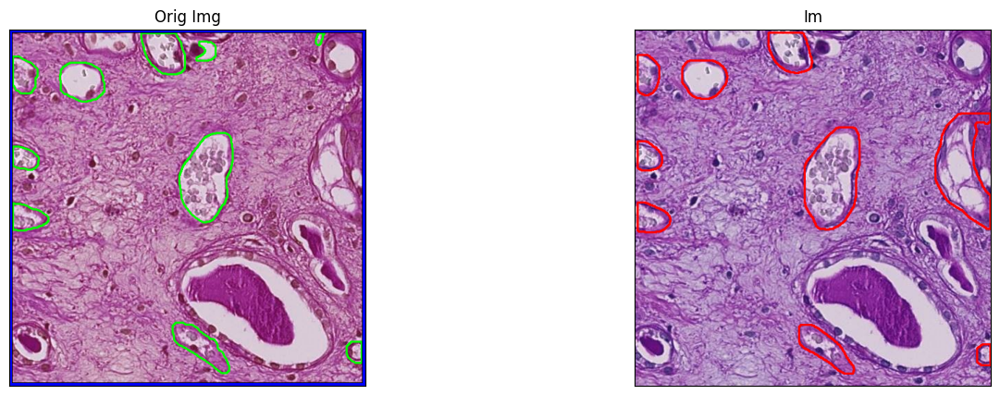


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/07bdbe578ded.png: 512x512 16 blood vessels, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


07bdbe578ded


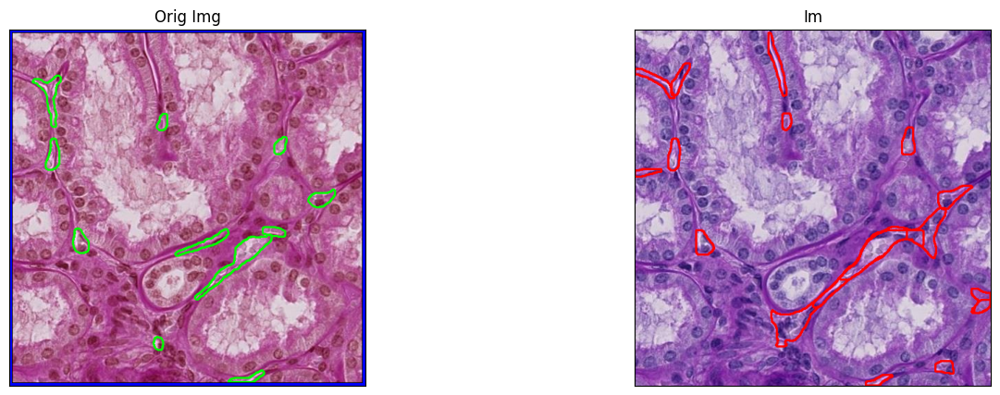


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/d2378fe9bcbd.png: 512x512 10 blood vessels, 6.5ms
Speed: 1.1ms preprocess, 6.5ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


d2378fe9bcbd


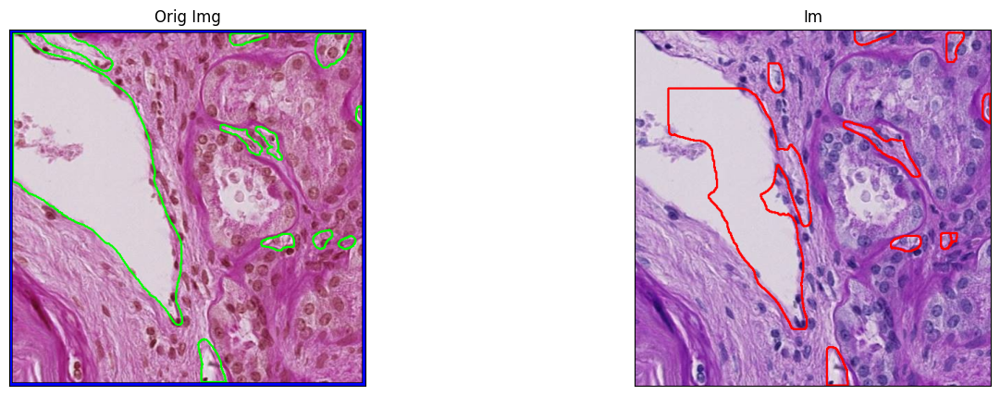


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/c66de2904503.png: 512x512 7 blood vessels, 6.4ms
Speed: 1.3ms preprocess, 6.4ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


c66de2904503


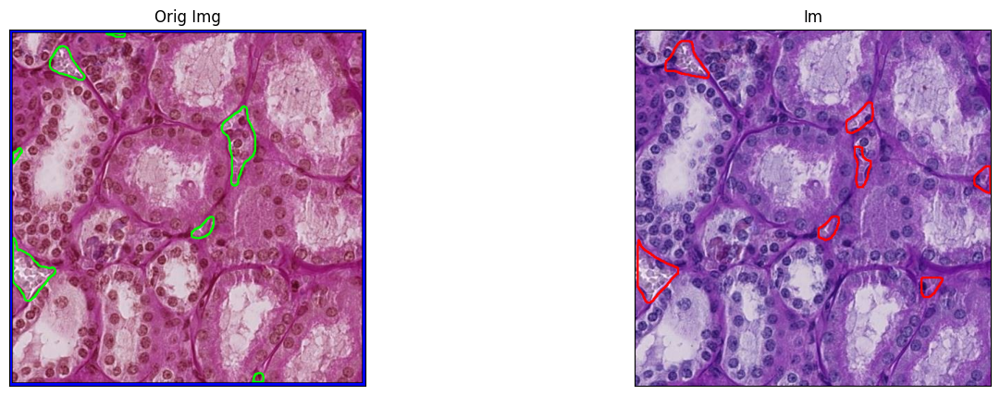


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/91858313a40e.png: 512x512 5 blood vessels, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


91858313a40e


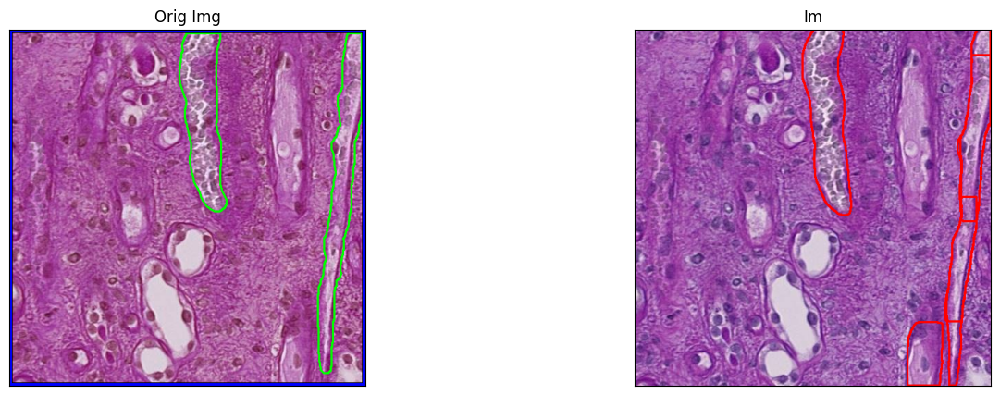


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/d953fe03e1d0.png: 512x512 16 blood vessels, 6.4ms
Speed: 1.0ms preprocess, 6.4ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


d953fe03e1d0


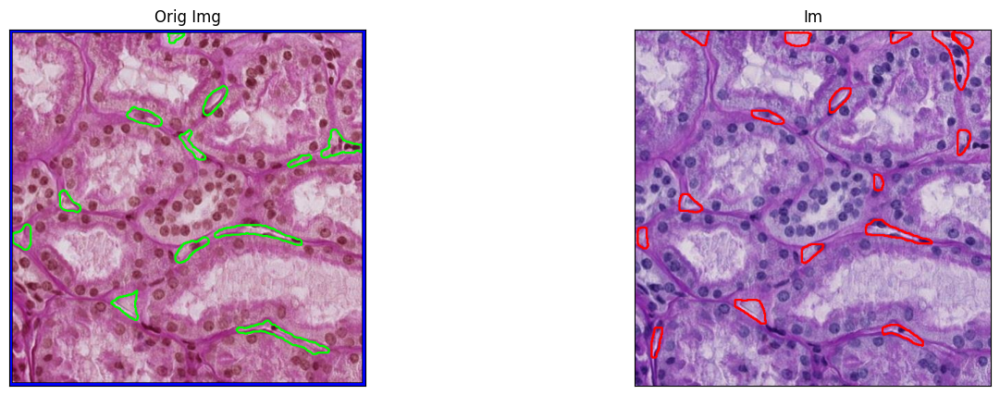


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/1a785cc0d167.png: 512x512 1 blood vessel, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


1a785cc0d167


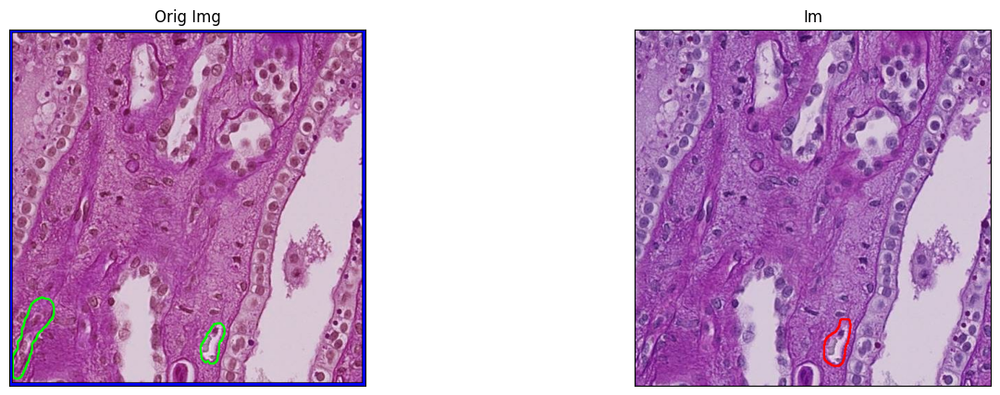


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/0067d5ad2250.png: 512x512 7 blood vessels, 6.5ms
Speed: 1.1ms preprocess, 6.5ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


0067d5ad2250


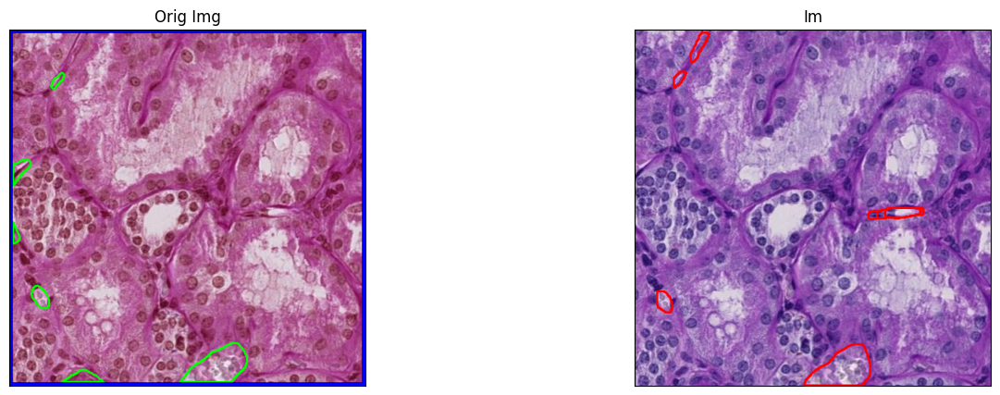


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/7e97ecdac5d2.png: 512x512 8 blood vessels, 6.5ms
Speed: 1.0ms preprocess, 6.5ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


7e97ecdac5d2


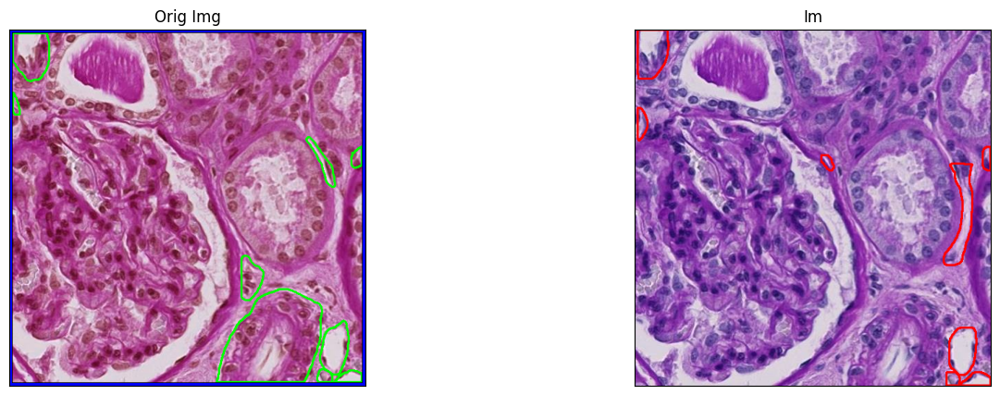


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/327dcb16a7ef.png: 512x512 12 blood vessels, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


327dcb16a7ef


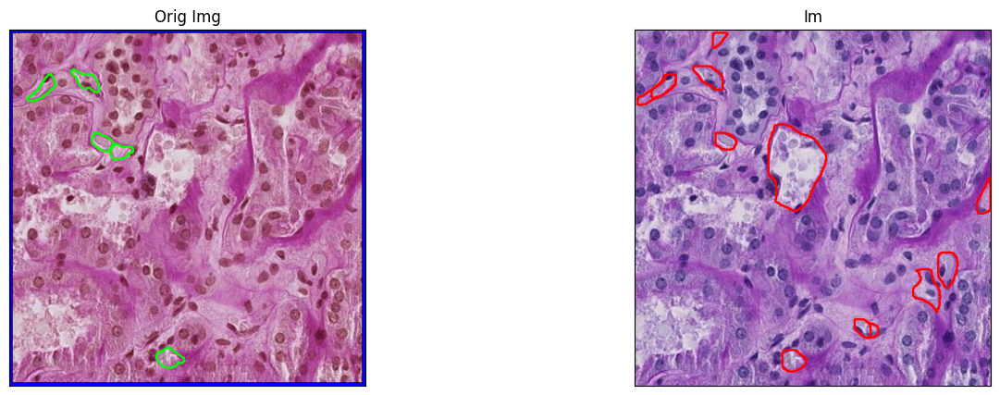


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/5ea525251225.png: 512x512 17 blood vessels, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 2.3ms postprocess per image at shape (1, 3, 512, 512)


5ea525251225


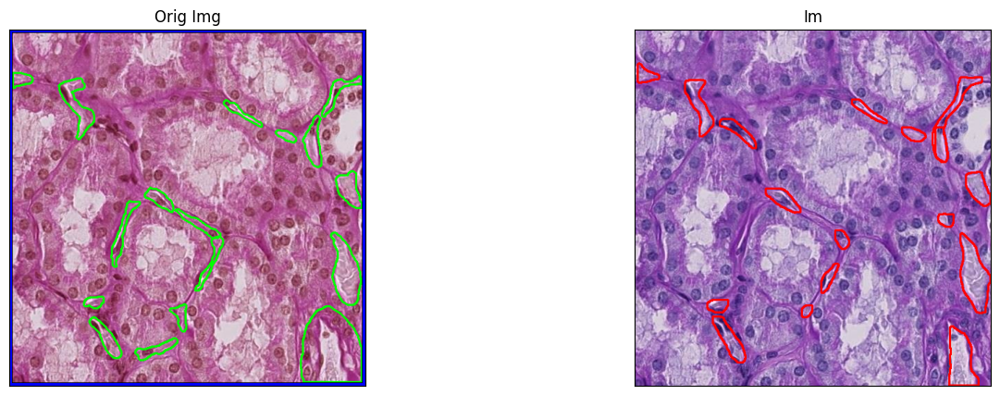


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/d6d79e965902.png: 512x512 4 blood vessels, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


d6d79e965902


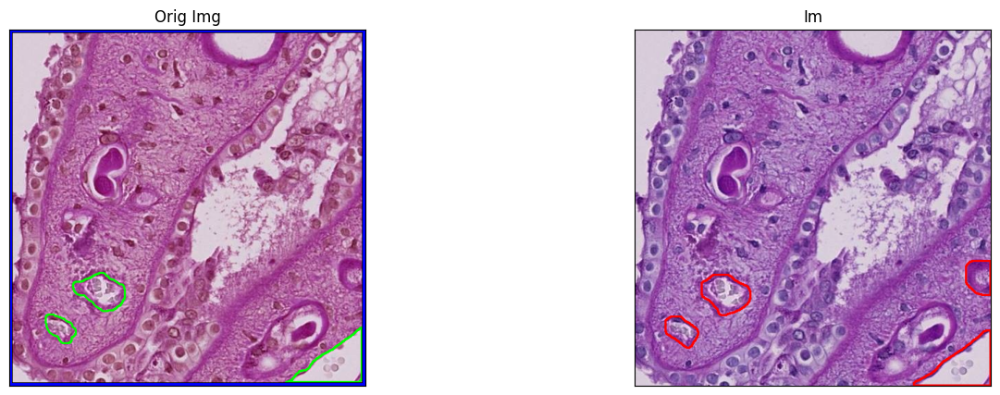


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/5a89c7f7ad05.png: 512x512 6 blood vessels, 6.4ms
Speed: 1.0ms preprocess, 6.4ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


5a89c7f7ad05


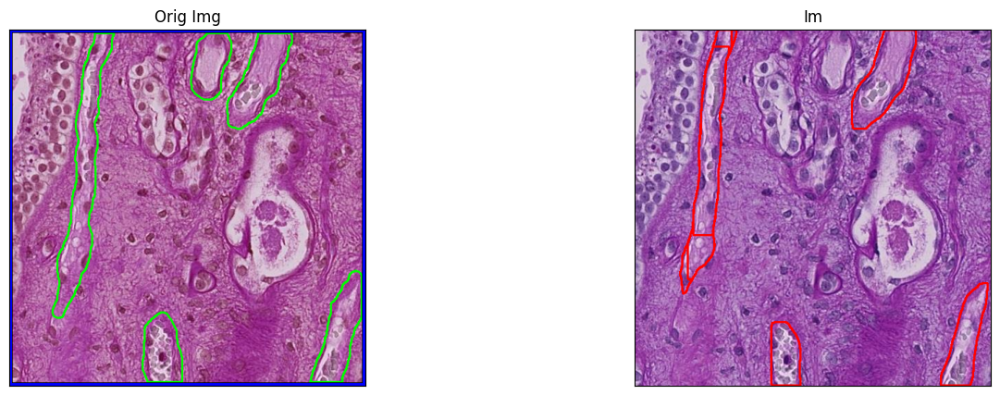


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/8f4c08f55c0f.png: 512x512 32 blood vessels, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)


8f4c08f55c0f


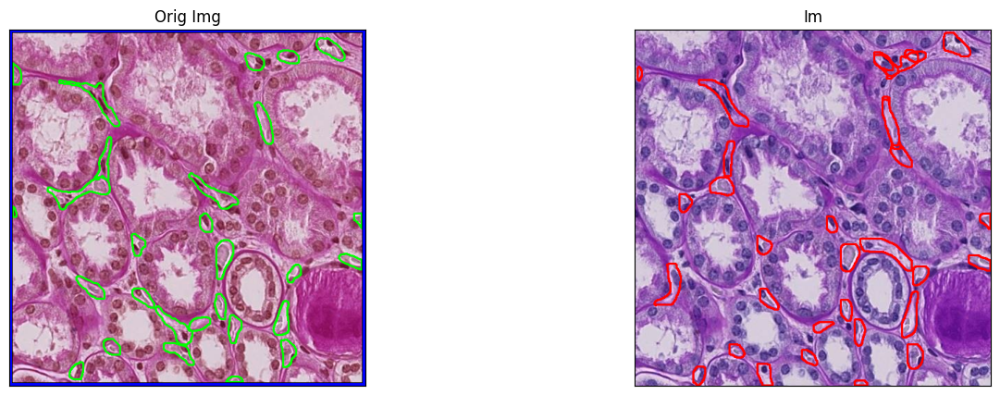


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/3e01bb974a1b.png: 512x512 19 blood vessels, 6.4ms
Speed: 1.0ms preprocess, 6.4ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 512)


3e01bb974a1b


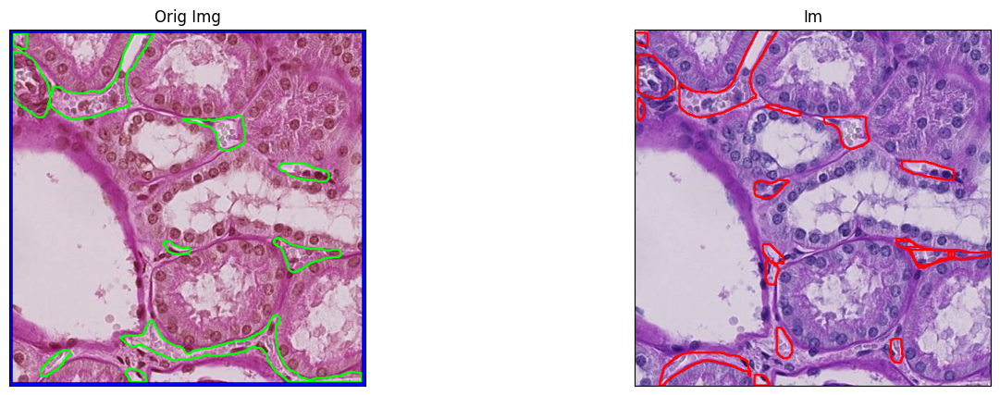


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/bd4bbe103c24.png: 512x512 10 blood vessels, 6.5ms
Speed: 1.0ms preprocess, 6.5ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


bd4bbe103c24


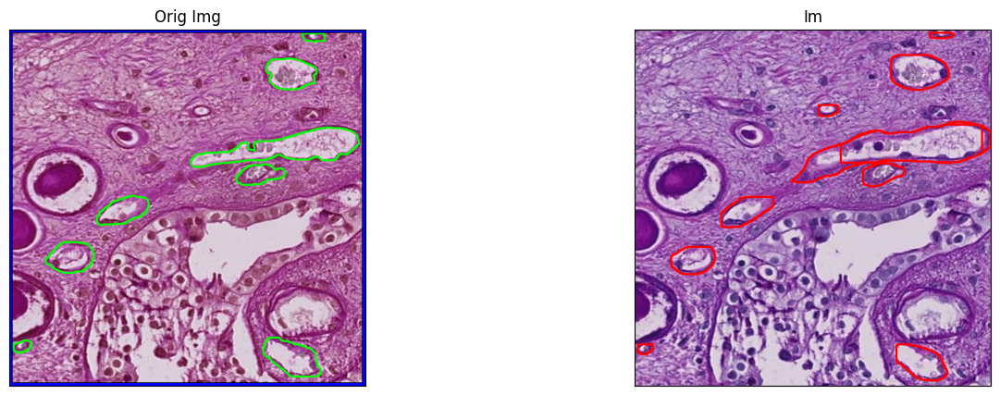


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/edae2e5c9f10.png: 512x512 12 blood vessels, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


edae2e5c9f10


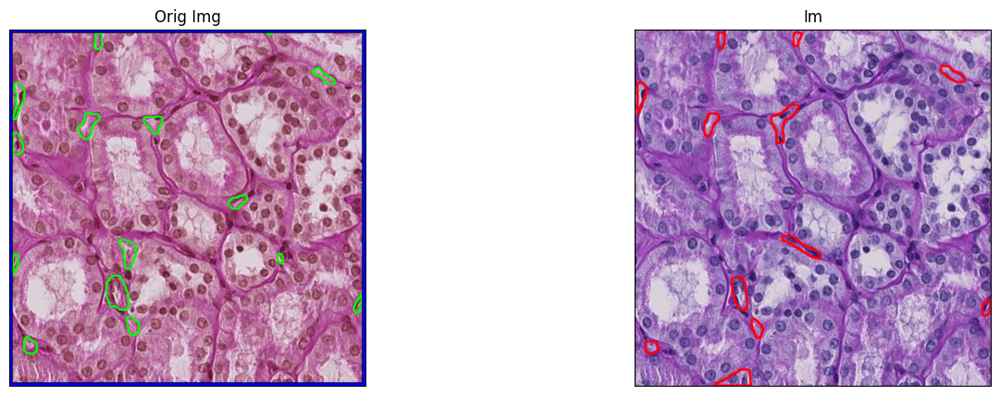


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/1bd726055ad8.png: 512x512 3 blood vessels, 6.5ms
Speed: 1.1ms preprocess, 6.5ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)


1bd726055ad8


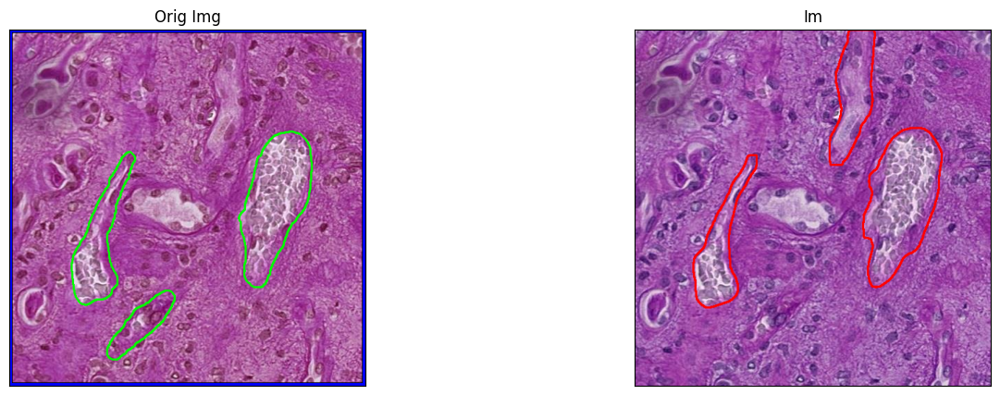


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/352c7fdfb717.png: 512x512 4 blood vessels, 6.4ms
Speed: 1.1ms preprocess, 6.4ms inference, 1.9ms postprocess per image at shape (1, 3, 512, 512)


352c7fdfb717


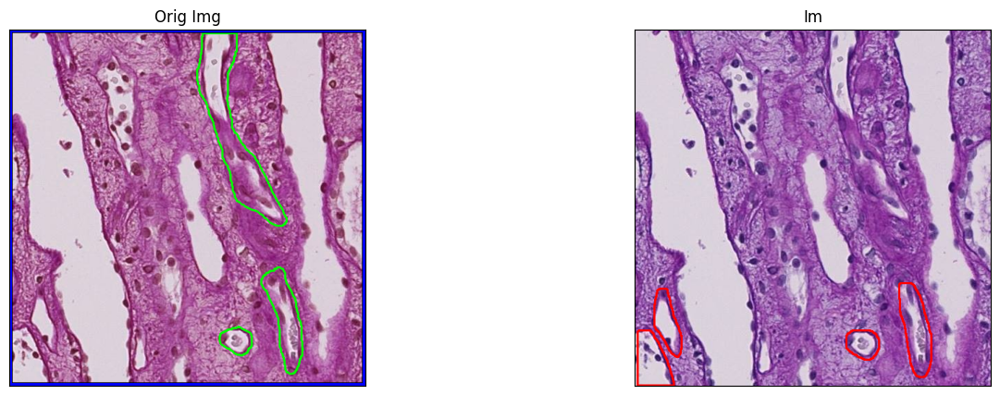


image 1/1 /home/ec2-user/hubmap-hacking-the-human-vasculature/project_yolo/../all_dataset_files/all_dataset_imgs/51a2ad418b22.png: 512x512 17 blood vessels, 6.5ms
Speed: 1.0ms preprocess, 6.5ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)


51a2ad418b22


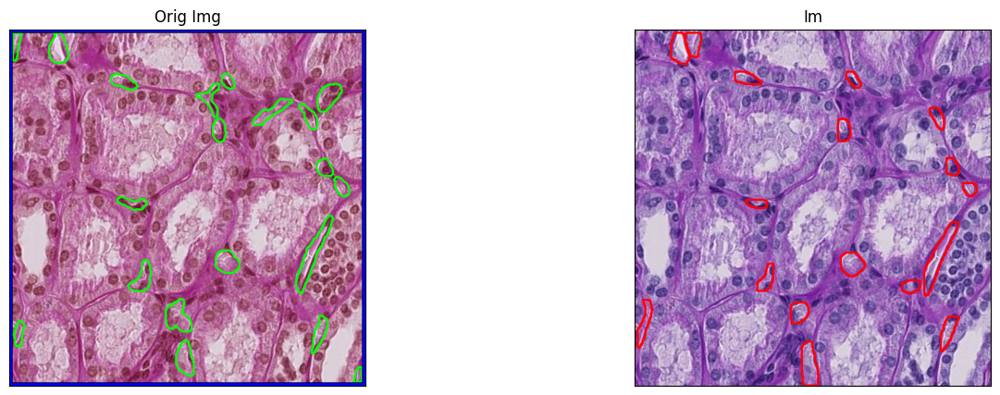

In [12]:
import pickle
import matplotlib.pyplot as plt
dataset2_imgs = os.listdir(f'{base_path}/dataset1_files/all_dataset1_imgs_validation_0')
i=5
for i in range(20):
    tgt_img_id = dataset2_imgs[i].split('.png')[0]
    print(tgt_img_id)
    orig_img = get_annotated_img(f'{base_path}/all_dataset_files/all_dataset_imgs', f'{base_path}/all_dataset_files/all_dataset_annotations', tgt_img_id, fill_outline=True)
    # img_mask = cv2.imread(f'{base_path}/dataset1_files/all_dataset1_masks_merged_{train_mode}_{i}/{tgt_img_id}.png', cv2.IMREAD_GRAYSCALE)
    results = model.predict(f'{base_path}/all_dataset_files/all_dataset_imgs/{tgt_img_id}.png')
    for result in results:
        boxes = result.boxes  # Boxes object for bbox outputs
        masks = result.masks  # Masks object for segmentation masks outputs
    im = cv2.imread(f'{base_path}/all_dataset_files/all_dataset_imgs/{tgt_img_id}.png')
    for i in range(len(boxes)):
      conf = boxes[i].conf
      box_coords = boxes[i].xyxy[0].cpu().numpy().astype('int32')
#       cv2.drawContours(im, [masks[i].xy[0].astype('int32')], 0, (255,0,0), -1)
      cv2.polylines(im, [masks[i].xy[0].astype('int32')], True, (255, 0, 0), 2)
#       print(masks[i])
#       print(masks[i].data.squeeze().cpu().numpy().shape)
#       plt.imshow(masks[i].data.squeeze().cpu().numpy())
#       plt.show()
#       cv2.rectangle(im, (box_coords[0], box_coords[1]), (box_coords[2], box_coords[3]), (0,255,0), thickness=2)
    img_dict = {'orig_img': orig_img, 'im': im}
    visualize(**img_dict)
    plt.show()

In [8]:
metrics = model.val(verbose=True)

Ultralytics YOLOv8.0.121 🚀 Python-3.10.11 torch-2.0.1+cu117 CUDA:0 (Tesla T4, 15102MiB)
val: Scanning /home/ec2-user/hubmap-hacking-the-human-vasculature/dataset1_files/yolo_dataset1_validation_0/labels.cache... 85
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP
                   all         85        703      0.716      0.602      0.675      0.374      0.715       0.62      0.689      0.346
Speed: 1.5ms preprocess, 13.2ms inference, 0.0ms loss, 7.3ms postprocess per image
Results saved to runs/segment/val


In [ ]:
metrics